# Импорт данных

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Обработка данных

In [ ]:
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/checkins.dat', sep="\|\s+", skiprows=2,names=['id', 'user_id', 'venue_id', 'latitude', 'longitude', 'created_at'], engine='python')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1021966 entries, 0 to 1021965
Data columns (total 6 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   id          1021966 non-null  object 
 1   user_id     1021965 non-null  float64
 2   venue_id    1021965 non-null  float64
 3   latitude    396634 non-null   float64
 4   longitude   396634 non-null   float64
 5   created_at  1021965 non-null  object 
dtypes: float64(4), object(2)
memory usage: 46.8+ MB


Удалим строки без координат

In [ ]:
df.head()

,id,user_id,venue_id,latitude,longitude,created_at
0,984222,15824.0,5222.0,38.895112,-77.036366,2012-04-21 17:43:47
1,984315,1764391.0,5222.0,NaN,NaN,2012-04-21 17:37:18
2,984234,44652.0,5222.0,33.800745,-84.410520,2012-04-21 17:43:43
3,984249,2146840.0,5222.0,NaN,NaN,2012-04-21 17:42:58
4,984268,2146843.0,5222.0,NaN,NaN,2012-04-21 17:42:38


In [ ]:
print(df.head(5))
print('edited:')
df = df.dropna(axis=0, subset=['latitude', 'longitude'])
print(df.head(5))

        id    user_id  venue_id   latitude  longitude           created_at
0  984222     15824.0    5222.0  38.895112 -77.036366  2012-04-21 17:43:47
1  984315   1764391.0    5222.0        NaN        NaN  2012-04-21 17:37:18
2  984234     44652.0    5222.0  33.800745 -84.410520  2012-04-21 17:43:43
3  984249   2146840.0    5222.0        NaN        NaN  2012-04-21 17:42:58
4  984268   2146843.0    5222.0        NaN        NaN  2012-04-21 17:42:38
edited:
        id    user_id  venue_id   latitude   longitude           created_at
0  984222     15824.0    5222.0  38.895112  -77.036366  2012-04-21 17:43:47
2  984234     44652.0    5222.0  33.800745  -84.410520  2012-04-21 17:43:43
6  984291    105054.0    5222.0  45.523452 -122.676207  2012-04-21 17:39:22
8  984318   2146539.0    5222.0  40.764462 -111.904565  2012-04-21 17:35:46
9  984232     93870.0  380645.0  33.448377 -112.074037  2012-04-21 17:38:18


In [ ]:
new_df = df.drop(['id', 'user_id', 'venue_id', 'created_at'], 1)
new_df = new_df.reset_index(drop=True)
new_df.head(5)

,latitude,longitude
0,38.895112,-77.036366
1,33.800745,-84.410520
2,45.523452,-122.676207
3,40.764462,-111.904565
4,33.448377,-112.074037


# Посмотрим на данные

In [ ]:
import plotly.express as px

fig = px.scatter(new_df, x="latitude", y="longitude")
fig.show()

In [ ]:
import numpy as np
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.datasets import make_blobs

# #############################################################################
# Generate sample data
x = new_df['latitude']
y = new_df['longitude']
X = np.column_stack((x,y))
# #############################################################################
# Compute clustering with MeanShift

# The following bandwidth can be automatically detected using
bandwidth = estimate_bandwidth(X, quantile=0.3, n_samples=50000)

ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(X)
labels = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)

print("number of estimated clusters : %d" % n_clusters_)

number of estimated clusters : 21


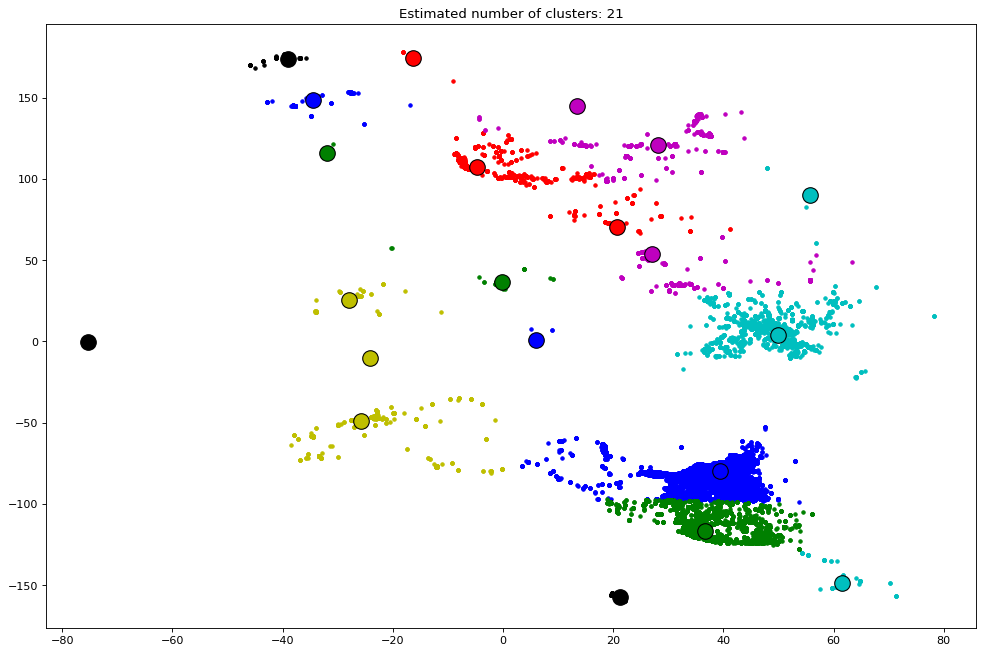

In [ ]:
# #############################################################################
# Plot result
import matplotlib.pyplot as plt
from itertools import cycle

plt.figure(figsize=(15, 10), dpi=80)
plt.clf()

colors = cycle("bgrcmykbgrcmykbgrcmykbgrcmyk")
for k, col in zip(range(n_clusters_), colors):
    my_members = labels == k
    cluster_center = cluster_centers[k]
    plt.plot(X[my_members, 0], X[my_members, 1], col + ".")
    plt.plot(
        cluster_center[0],
        cluster_center[1],
        "o",
        markerfacecolor=col,
        markeredgecolor="k",
        markersize=14,
    )
plt.title("Estimated number of clusters: %d" % n_clusters_)
plt.show()

In [ ]:
for i in range(len(cluster_centers)):
  print(str(round(cluster_centers[i][0], 4)) + ' ' + str(round(cluster_centers[i][1], 4)))

39.335 -79.7522
36.7607 -116.9199
-4.6508 107.248
49.9032 3.8113
28.1869 121.0888
-25.6865 -48.9101
21.1665 -157.5707
-34.5639 148.8742
-0.1926 36.6703
20.7495 70.4711
61.5596 -148.593
27.0218 54.0533
-28.0108 25.3617
-38.9616 174.1358
5.9041 1.0505
-31.8965 116.142
-16.3333 174.7923
55.7593 90.3934
13.4516 144.7706
-24.1435 -10.0307
-75.251 -0.0714


# Результаты 

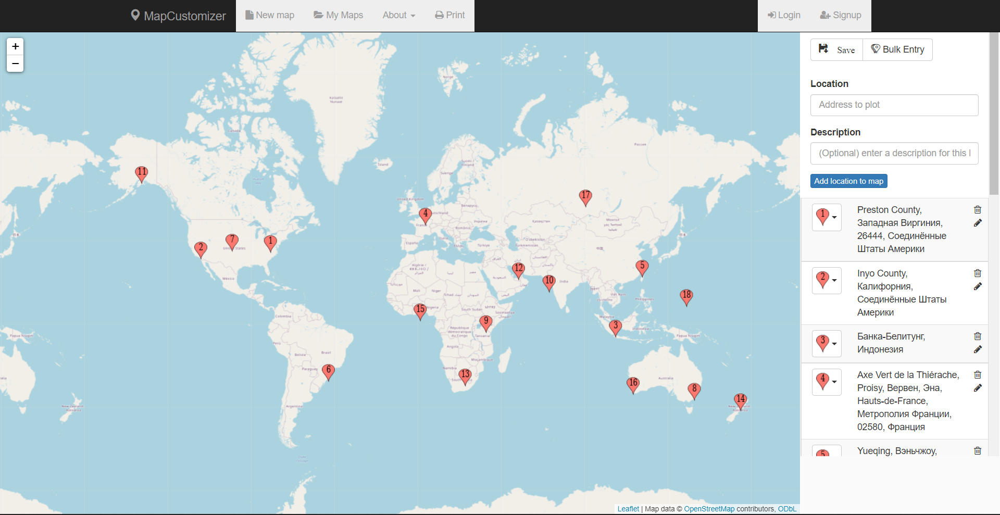